<center>

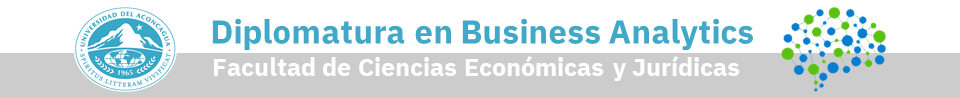

</center>

<center>
<font color="#41a8c7">
<h2><b>
Código Trabajo Final - Caso Rotación de Clientes - Customer Churn

</font>
</center>

## Descripción del dataset

**El dataset pertenece a una compañía que ofrece servicio telefónico, internet, servicios web, etc.**
**La deserción de clientes (también conocida como pérdida de clientes) es una de las mayores causas de pérdida de cualquier organización. Si pudiéramos averiguar por qué un cliente se va y cuándo se va con una precisión razonable, ayudaría enormemente a la organización a diseñar estrategias de fidelización.**

---

CustomerID: ID único de cada cliente

Count: Valor de 1 para realizar sumas de clientes

Country: País donde vive cliente

State: Estado donde vive el cliente

City: Ciudad donde vive el cliente

Zip Code: Codigo postal del cliente

Lat Long: Combinación de la latitud y longitud del cliente

Latitude: Latitud

Longitude: Longitud

Gender: Genero del cliente

Senior Citizen: Indica si el cliente es mayor de 65 años (Si, No)

Partner: Indica si el cliente tiene pareja (Si, No)

Dependents: Indica si el cliente vive con dependientes (Si, No). Dependientes pueden ser hijos, parientes, padres

Tenure Months: Indica la cantidad de meses que el cliente forma parte de la compañia (Antiguedad)

Phone Service: Indica si el cliente tiene contratado servicio telefónico con la compañia (Si, No)

Multiple Lines: Indica si el cliente tiene contratadomúltiples líneas telefónicas (Si, No)

Internet Service: Indica si el cliente tiene contratado servicio de internet (No, DSL, Fiber Optic, Cable)

Online Security: Indica si el cliente tiene contratado el servicio de seguridad online (Si, No)

Online Backup: Indica si el cliente tiene contratado el servicio de backup - copia de seguridad (Si, No)

Device Protection: Indica si el cliente tiene contratado el servicio de protección del dispositivo (Si, No)

Tech Support: Indica si el cliente tiene contratado el servicio de soporte técnico para agilizar tiempos de respuesta (Si, No)

Streaming TV: Indica si el cliente tiene contratado un servicio de TV por streaming con un proveedor externo (Si, No). La compañia no genera cargos adicionales por este servicio

Streaming Movies: Indica si el cliente tiene contratado un servicio de películas y series por streaming con un proveedor externo (Si, No). La compañia no genera cargos adicionales por este servicio

Contract: Indica el contrato que posee el cliente con la compañía (Month-to-Month, One Year, Two Year)

Paperless Billing: Indica si el cliente ha elegido factura electrónica (Si, No)

Payment Method: Indica como el cliente paga su factura (Bank Withdrawal, Credit Card, Mailed Check)

Monthly Charge: Indica el monto MENSUAL de todos los servicios que paga el cliente

Total Charges: Indica el monto HISTÓRICO que ha pagado el cliente desde su primer factura

Churn Label: Yes = El cliente abandonó la empresa. No = El cliente continua siendo cliente

Churn Value: Es el valor binario de Churn Label Yes = 1, No = 0

Churn Score: Es un score generado de la probabilidad de que abandone la compañía

CLTV: Es el valor de vida del cliente (Customer Lifetime Value). Mientras más alto es el valor, más valioso es el cliente. Se debe monitorear clientes con alto CLTV

Churn Reason: Razón por la cual el cliente abandonó la compañia

# Carga de datos

In [ ]:
!pip install pandas==1.3.4
!pip install pandas-profiling==3.1.0
!pip install pycaret

In [ ]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
import pandas as pd

In [ ]:
train = pd.read_csv("https://raw.githubusercontent.com/LucaAPiattelli/Diplomatura_Business_Analytics_UDA/main/Datasets/train.csv")
test = pd.read_csv("https://raw.githubusercontent.com/LucaAPiattelli/Diplomatura_Business_Analytics_UDA/main/Datasets/test.csv")

In [ ]:
df = train
print('Data for Modeling: ' + str(df.shape))


Data for Modeling: (5274, 32)


In [ ]:
df_2 = test
print('Unseen data for Predictions: ' + str(df_2.shape))

Unseen data for Predictions: (1758, 32)


# **Análisis Exploratorio de Datos**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5274 entries, 0 to 5273
Data columns (total 32 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         5274 non-null   int64  
 1   CustomerID         5274 non-null   object 
 2   Count              5274 non-null   int64  
 3   Country            5274 non-null   object 
 4   State              5274 non-null   object 
 5   City               5274 non-null   object 
 6   Zip Code           5274 non-null   int64  
 7   Lat Long           5274 non-null   object 
 8   Latitude           5274 non-null   float64
 9   Longitude          5274 non-null   float64
 10  Gender             5274 non-null   object 
 11  Senior Citizen     5274 non-null   object 
 12  Partner            5274 non-null   object 
 13  Dependents         5274 non-null   object 
 14  Tenure Months      5274 non-null   int64  
 15  Phone Service      5274 non-null   object 
 16  Multiple Lines     5274 

##Obtengo nuevo dataframe en base a los clientes activos: se busca segmentación de clientes

In [ ]:
churn_label_no = df['Churn Label'] == 'No'

In [ ]:
clientes = df.copy()
clientes = clientes[clientes['Churn Label'] == 'No']

In [ ]:
clientes.head()

,Unnamed: 0,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,CLTV,Churn Reason
0,5552,7838-LAZFO,1,United States,California,Hanford,93230,"36.29223, -119.622676",36.292230,-119.622676,Male,No,Yes,No,45,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,One year,No,Bank transfer (automatic),78.8,3597.50,No,4192,NaN
1,5805,8189-DUKMV,1,United States,California,Rancho Cordova,95742,"38.591134, -121.161585",38.591134,-121.161585,Female,No,Yes,No,4,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,No,Bank transfer (automatic),20.5,79.05,No,3233,NaN
2,2640,3758-CKOQL,1,United States,California,Valyermo,93563,"34.39583, -117.734568",34.395830,-117.734568,Female,No,Yes,No,59,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,No,Yes,One year,Yes,Credit card (automatic),107.0,6152.30,No,4620,NaN
3,3976,5619-PTMIK,1,United States,California,Lemon Grove,91945,"32.733564, -117.033713",32.733564,-117.033713,Female,No,Yes,No,46,Yes,Yes,DSL,Yes,No,No,No,No,No,Month-to-month,No,Electronic check,53.1,2459.80,No,3358,NaN
4,6429,9115-YQHGA,1,United States,California,Lemoore,93245,"36.303666, -119.825657",36.303666,-119.825657,Male,No,No,No,40,Yes,No,DSL,No,No,No,Yes,No,No,Month-to-month,Yes,Electronic check,51.1,2092.90,No,3355,NaN


In [ ]:
clientes.shape #nuevo dataframe

(3863, 32)

##Eliminar las variables que no son relevantes

In [ ]:
clientes.drop(columns='Churn Reason', inplace = True)

In [ ]:
clientes.drop(columns='Unnamed: 0', inplace = True)
clientes.drop(columns='CustomerID', inplace = True)
clientes.drop(columns='Count', inplace = True)
clientes.drop(columns='Country', inplace = True)
clientes.drop(columns='State', inplace = True)
clientes.drop(columns='Zip Code', inplace = True)
clientes.drop(columns='Lat Long', inplace = True)
clientes.drop(columns='Latitude', inplace = True)
clientes.drop(columns='Longitude', inplace = True)
clientes.drop(columns='Churn Label', inplace = True)

In [ ]:
clientes.shape #controlo consistencia del dataframe

(3863, 21)

##Análisis con Pandas Profiling

In [ ]:
from pandas_profiling import ProfileReport
prof = ProfileReport(clientes)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
cities = pd.read_csv("https://raw.githubusercontent.com/rliquitay/tpfinal_diplo_bi/main/california_cities.csv", sep=";")
cities.head() #DataFrame con ciudades y condados de California

,city,city_ascii,state_name,county_name,norte-sur
0,Acalanes Ridge,Acalanes Ridge,California,Contra Costa,norte
1,Acampo,Acampo,California,San Joaquin,norte
2,Adin,Adin,California,Modoc,norte
3,Ahwahnee,Ahwahnee,California,Madera,norte
4,Airport,Airport,California,Stanislaus,norte


##Ingeniería de Variables

In [ ]:
cities = cities[['city','county_name','norte-sur']] #DataFrame con ciudades y condados de California

In [ ]:
clientes_cities = pd.merge(clientes, cities, left_on='City', right_on='city', how='left')
clientes_cities.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3863 entries, 0 to 3862
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   City               3863 non-null   object 
 1   Gender             3863 non-null   object 
 2   Senior Citizen     3863 non-null   object 
 3   Partner            3863 non-null   object 
 4   Dependents         3863 non-null   object 
 5   Tenure Months      3863 non-null   int64  
 6   Phone Service      3863 non-null   object 
 7   Multiple Lines     3863 non-null   object 
 8   Internet Service   3863 non-null   object 
 9   Online Security    3863 non-null   object 
 10  Online Backup      3863 non-null   object 
 11  Device Protection  3863 non-null   object 
 12  Tech Support       3863 non-null   object 
 13  Streaming TV       3863 non-null   object 
 14  Streaming Movies   3863 non-null   object 
 15  Contract           3863 non-null   object 
 16  Paperless Billing  3863 

In [ ]:
clientes = clientes_cities.reindex(columns=[
                                            'norte-sur',
                                            'county_name',
                                            'city',
                                            'Gender',
                                            'Senior Citizen',
                                            'Partner',
                                            'Dependents',
                                            'Tenure Months',
                                            'Phone Service',
                                            'Multiple Lines',
                                            'Internet Service',
                                            'Online Security',
                                            'Online Backup',
                                            'Device Protection',
                                            'Tech Support',
                                            'Streaming TV',
                                            'Streaming Movies',
                                            'Contract',
                                            'Paperless Billing',
                                            'Payment Method',
                                            'Monthly Charges',
                                            'Total Charges',
                                            'CLTV',
                                            'City']) #reordenamiento del DataFrame

##Convertir Variables Categóricas a Numéricas

In [ ]:
clientes['Gender'] = clientes['Gender'].map({'Male': 1,'Female':2}, na_action=None)
clientes['Phone Service'] = clientes['Phone Service'].map({'No': 0,'Yes':1}, na_action=None)
clientes['Multiple Lines'] = clientes['Multiple Lines'].map({'No': 0,'Yes':1,'No phone service': 0},na_action=None)
clientes['Internet Service'] = clientes['Internet Service'].map({'DSL': 1,'Fiber optic':1,'No': 0},na_action=None)
clientes['Online Security'] = clientes['Online Security'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes['Online Backup'] = clientes['Online Backup'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes['Device Protection'] = clientes['Device Protection'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes['Tech Support'] = clientes['Tech Support'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes['Streaming TV'] = clientes['Streaming TV'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes['Streaming Movies'] = clientes['Streaming Movies'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes['Contract'] = clientes['Contract'].map({'One year': 1,'Two year': 2,'Month-to-month': 0},na_action=None)
clientes['Paperless Billing'] = clientes['Paperless Billing'].map({'Yes': 1,'No': 0},na_action=None)
clientes['Payment Method'] = clientes['Payment Method'].map({'Bank transfer (automatic)': 0,'Credit card (automatic)': 1, 'Electronic check':2,'Mailed check':3},na_action=None)
clientes['Senior Citizen'] = clientes['Senior Citizen'].map({'Yes': 1,'No': 0},na_action=None)
clientes['Partner'] = clientes['Partner'].map({'Yes': 1,'No': 0},na_action=None)
clientes['Dependents'] = clientes['Dependents'].map({'Yes': 1,'No': 0},na_action=None)
clientes['norte-sur'] = clientes['norte-sur'].map({'norte': 0,'sur': 1},na_action=None)

In [ ]:
clientes = clientes.drop('City', axis=1) #elimino columna City para trabajar con columna Condados que es más compacta
clientes = clientes.drop('city', axis=1)

In [ ]:
from sklearn.preprocessing import LabelEncoder #convierto valores categóricos a numéricos

convertir = LabelEncoder()

clientes['county_name'] = convertir.fit_transform(clientes['county_name'])

In [ ]:
clientes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3863 entries, 0 to 3862
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   norte-sur          3863 non-null   int64  
 1   county_name        3863 non-null   int64  
 2   Gender             3863 non-null   int64  
 3   Senior Citizen     3863 non-null   int64  
 4   Partner            3863 non-null   int64  
 5   Dependents         3863 non-null   int64  
 6   Tenure Months      3863 non-null   int64  
 7   Phone Service      3863 non-null   int64  
 8   Multiple Lines     3863 non-null   int64  
 9   Internet Service   3863 non-null   int64  
 10  Online Security    3863 non-null   int64  
 11  Online Backup      3863 non-null   int64  
 12  Device Protection  3863 non-null   int64  
 13  Tech Support       3863 non-null   int64  
 14  Streaming TV       3863 non-null   int64  
 15  Streaming Movies   3863 non-null   int64  
 16  Contract           3863 

In [ ]:
clientes.head()

,norte-sur,county_name,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,CLTV
0,0,15,1,0,1,0,45,1,0,1,1,1,1,0,1,1,1,0,0,78.8,3597.50,4192
1,0,33,2,0,1,0,4,1,0,0,0,0,0,0,0,0,1,0,0,20.5,79.05,3233
2,1,18,2,0,1,0,59,1,1,1,1,1,1,1,0,1,1,1,1,107.0,6152.30,4620
3,1,36,2,0,1,0,46,1,1,1,1,0,0,0,0,0,0,0,2,53.1,2459.80,3358
4,0,15,1,0,0,0,40,1,0,1,0,0,0,1,0,0,0,1,2,51.1,2092.90,3355


In [ ]:
#Experimento para probar el modelo y ver si aumentan las métricas según la codificación de determinadas variables
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
columns = ['norte-sur',
'county_name',
'Gender',
'Senior Citizen',
'Partner',
'Dependents',
'Tenure Months',
'Phone Service',
'Multiple Lines',
'Internet Service',
'Online Security',
'Online Backup',
'Device Protection',
'Tech Support',
'Streaming TV',
'Streaming Movies',
'Contract',
'Paperless Billing',
'Payment Method',
'Monthly Charges',
'Total Charges',
'CLTV']

#monthly_charges_standard = scaler.fit_transform(clientes['Monthly Charges'].to_numpy().reshape(-1, 1))
#total_charges_standard = scaler.fit_transform(clientes['Total Charges'].to_numpy().reshape(-1, 1))
cltv_standard = scaler.fit_transform(clientes['CLTV'].to_numpy().reshape(-1, 1))
#tenure_months_standard = scaler.fit_transform(clientes['Tenure Months'].to_numpy().reshape(-1, 1))
#county_name_standard = scaler.fit_transform(clientes['county_name'].to_numpy().reshape(-1, 1))

clientes_standard = clientes.copy()
#clientes_standard['Monthly Charges'] = monthly_charges_standard
#clientes_standard['Total Charges'] = total_charges_standard
clientes_standard['CLTV'] = cltv_standard
#clientes_standard['Tenure Months'] = tenure_months_standard
#clientes_standard['county_name'] = county_name_standard

##Configurar entorno PyCaret

In [ ]:
from pycaret.clustering import setup, models, create_model, plot_model, assign_model, evaluate_model, predict_model, save_model, load_model

In [ ]:
features = ['norte-sur',
'county_name',
'Gender',
'Senior Citizen',
'Partner',
'Dependents',
'Tenure Months',
'Phone Service',
'Multiple Lines',
'Internet Service',
'Online Security',
'Online Backup',
'Device Protection',
'Tech Support',
'Streaming TV',
'Streaming Movies',
'Contract',
'Paperless Billing',
'Payment Method',
'Monthly Charges',
'Total Charges',
'CLTV']
agrupacion = setup(clientes_standard, numeric_features= features, session_id = 124)

,Description,Value
0,session_id,124
1,Original Data,"(3863, 22)"
2,Missing Values,False
3,Numeric Features,22
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(3863, 22)"
9,CPU Jobs,-1


# **Modelo de agrupación**

##Creación del modelo

In [ ]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


##Algoritmo K-Means

In [ ]:
km = create_model('kmeans', num_clusters=4)
print(km)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.589,20546.5507,0.5237,0,0,0


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=124, tol=0.0001, verbose=0)


##Asignando modelo

In [ ]:
km_resultados = assign_model(km)
km_resultados.head()

,norte-sur,county_name,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,CLTV,Cluster
0,0,15,1,0,1,0,45,1,0,1,1,1,1,0,1,1,1,0,0,78.8,3597.50,0.486763,Cluster 3
1,0,33,2,0,1,0,4,1,0,0,0,0,0,0,0,0,1,0,0,20.5,79.05,0.273415,Cluster 2
2,1,18,2,0,1,0,59,1,1,1,1,1,1,1,0,1,1,1,1,107.0,6152.30,0.581980,Cluster 1
3,1,36,2,0,1,0,46,1,1,1,1,0,0,0,0,0,0,0,2,53.1,2459.80,0.301224,Cluster 0
4,0,15,1,0,0,0,40,1,0,1,0,0,0,1,0,0,0,1,2,51.1,2092.90,0.300556,Cluster 0


In [ ]:
km_resultados.shape #se agrega una nueva columna llamada 'Cluster'

(3863, 23)

##Visualización del Modelo

### Elbow Plot - Sklearn

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=3).fit(clientes)
pca_values = pca.transform(clientes)

In [ ]:
pca_values = pd.DataFrame(data = pca_values, columns=['PC1','PC2','PC3'])

In [ ]:
clientes.shape[0] == pca_values.shape[0]

True

In [ ]:
pca_values.shape

(3863, 3)

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
n_clusters=10

In [ ]:
elbow = []

In [ ]:
for i in range(1,n_clusters):
    kmeans = KMeans(i)
    kmeans.fit(pca_values)
    elbow.append([i,kmeans.inertia_])

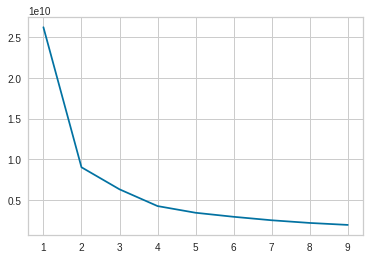

In [ ]:
plt.plot(pd.DataFrame(elbow)[0], pd.DataFrame(elbow)[1])

###Elbow Plot - PyCaret

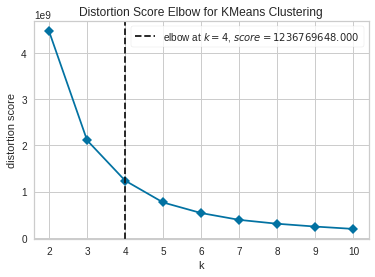

In [ ]:
plot_model(km, plot = 'elbow') #n° óptimo de clusters

###Silhouette Plot

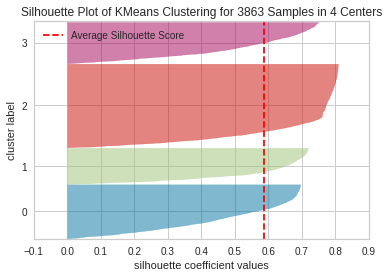

In [ ]:
plot_model(km, plot = 'silhouette')

###Cluster Plot

In [ ]:
plot_model(km, plot = 'cluster')

###Distribution Plot

In [ ]:
plot_model(km, plot = 'distribution') #para ver el tamaño de los clusters

### Distance Plot

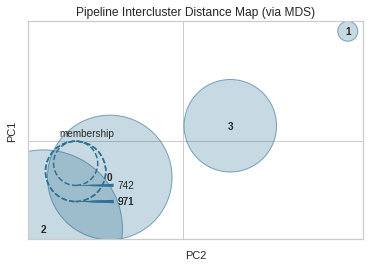

In [ ]:
plot_model(km, plot = 'distance')

##Análisis de cada Cluster

In [ ]:
import seaborn as sns

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

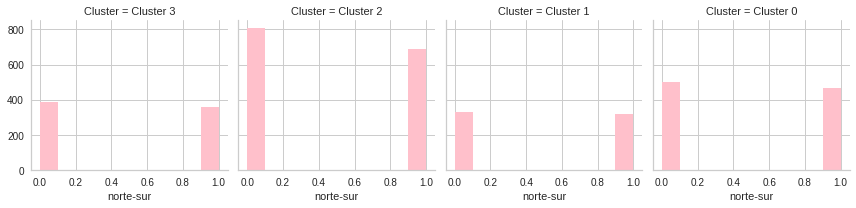

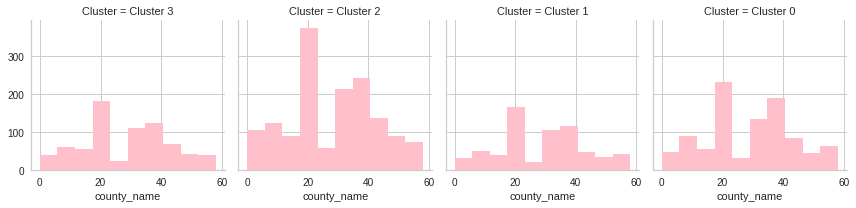

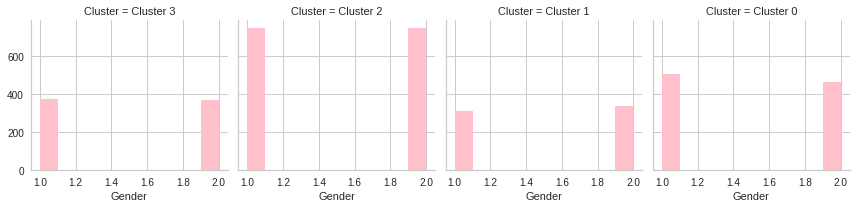

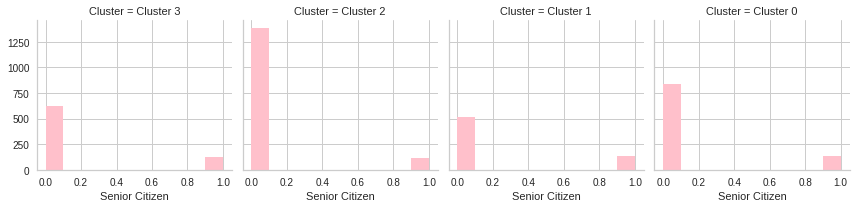

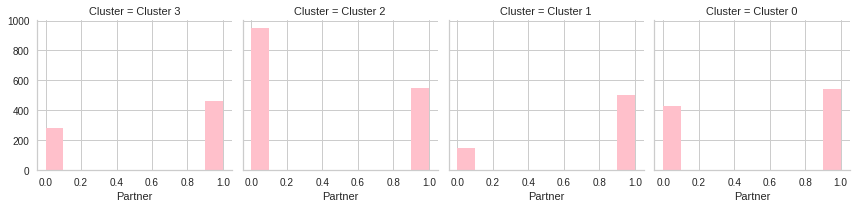

...

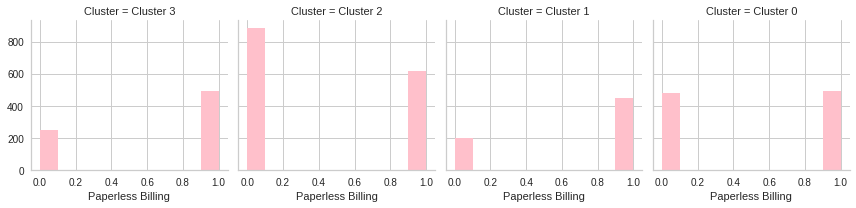

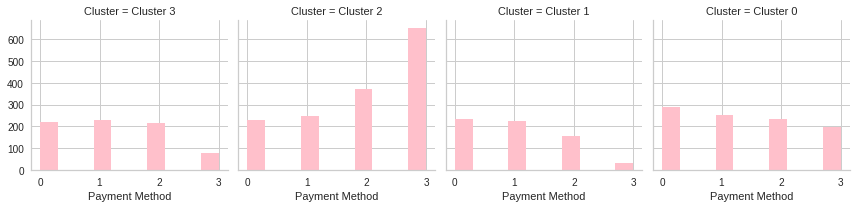

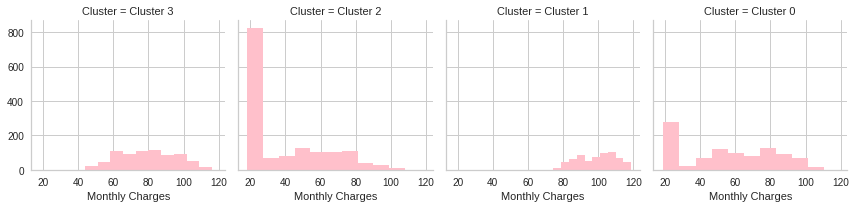

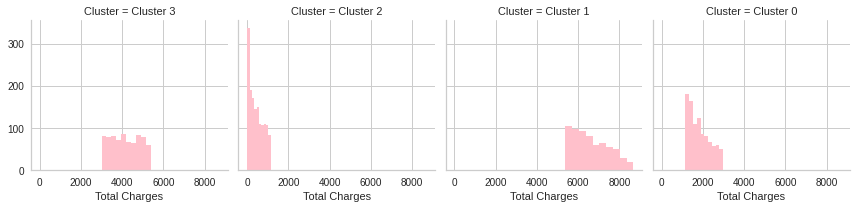

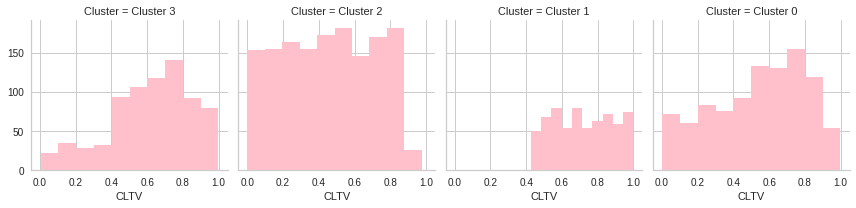

In [ ]:
for i in clientes: #para analizar cada cluster
    a = sns.FacetGrid(km_resultados, col='Cluster')
    a.map(plt.hist, i, color='pink')

Se identifican 4 cluster: siendo el más grande el Cluster 2, seguido por el Cluster 0, Cluster 3 y el más chico, el Cluster 1.

En cuanto a las variables Género, Senior Citizen y Condado; no hay diferencias relevantes entre los diferentes cluster para describir.

Los servicios principales que brinda la empresa son los de telefonía e internet. Telefonía es el servicio con alta presencia entre los cuatro cluster. Sin embargo, el servicio de Internet, en los cluster 2 y 0 la contratación es baja, lo cual llama la atención ya que son los cluster más grandes, como se dijo anteriormente.

Asimismo, con respecto a los 'Cargos Mensuales', los cluster 2 y 0 tienen un amplio rango que va desde los 20 pesos a 110 pesos, concentrándose las masas en el rango de 20 pesos a 30 pesos. En los cluster 1 y 3, la curva de ingresos mensuales es relativamente plana, pero con un rango superior que va desde los 60 pesos a 120 pesos. La variable 'Cargos Totales' presenta el mismo comportamiento.

Con respecto a la categoría 'CLTV' se observa que cluster 2 y 0 agrupan la mayor cantidad de los clientes, por lo tanto el CLTV acumulado es alto con respecto a los demás. Sin embargo el cluster 1 tiene pocos clientes pero con CLTV relativamente alto.

En base a estas observaciones se puede concluir que:

**Cluser 2:** cuenta con muchos clientes que pagan poco, esto por cuanto la mayoría no cuenta con el servicio de internet y en consecuencia tampoco con los servicios que dependen de éste como por ejemplo: seguridad online, back up, protección de dispositivos, etc. Además son clientes 'nuevos', ya que la antigüedad promedio de los mismos es de 2 años.

**Cluster 0:** cuenta con menos clientes que el cluster 2, y también la mayoría de los clientes no tiene el servicio de Internet contratado; sin embargo se distingue del cluster 2 por cuanto estos clientes poseen un CLTV más alto que aquél y la antigüedad promedio ronda entre los 2 y 3 años.

**Cluster 1:** es el grupo de clientes estrella de la empresa, tienen la mayoría de los servicios contratados (el 80% del cluster tiene los servicios adicionales de Internet contratados) y por lo tanto le generan más ingresos, tienen el CLTV más alto de todos los cluster y además están fidelizados, porque la antigüedad promedio ronda los 5 años. La única debilidad de este cluster es que los clientes que lo conforman son pocos.

**Cluster 3:** es otro de los cluster con clientes más antiguos de la empresa, en promedio 5 años, pero el CLTV es más bajo, y además tienen menos servicios dependientes de Internet contratados que el cluster 1: cerca del 50 % de los clientes tienen los servicios adicionales contratados.

##Predicción sobre datos no vistos

###Obtengo nuevo dataframe con clientes activos

In [ ]:
churn_label_no = df_2['Churn Label'] == 'No'

In [ ]:
clientes_no_vistos = df_2.copy()
clientes_no_vistos = clientes_no_vistos[clientes_no_vistos['Churn Label'] == 'No']

###Eliminar variables que no son relevantes

In [ ]:
clientes_no_vistos.drop(columns='Churn Reason', inplace = True)

In [ ]:
clientes_no_vistos.drop(columns='Unnamed: 0', inplace = True)
clientes_no_vistos.drop(columns='CustomerID', inplace = True)
clientes_no_vistos.drop(columns='Count', inplace = True)
clientes_no_vistos.drop(columns='Country', inplace = True)
clientes_no_vistos.drop(columns='State', inplace = True)
clientes_no_vistos.drop(columns='Zip Code', inplace = True)
clientes_no_vistos.drop(columns='Lat Long', inplace = True)
clientes_no_vistos.drop(columns='Latitude', inplace = True)
clientes_no_vistos.drop(columns='Longitude', inplace = True)
clientes_no_vistos.drop(columns='Churn Label', inplace = True)

###Ingeniería de variables sobre Datos No Vistos

In [ ]:
clientes_no_vistos_cities = pd.merge(clientes_no_vistos, cities, left_on='City', right_on='city', how='left')
clientes_no_vistos_cities.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1300 entries, 0 to 1299
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   City               1300 non-null   object 
 1   Gender             1300 non-null   object 
 2   Senior Citizen     1300 non-null   object 
 3   Partner            1300 non-null   object 
 4   Dependents         1300 non-null   object 
 5   Tenure Months      1300 non-null   int64  
 6   Phone Service      1300 non-null   object 
 7   Multiple Lines     1300 non-null   object 
 8   Internet Service   1300 non-null   object 
 9   Online Security    1300 non-null   object 
 10  Online Backup      1300 non-null   object 
 11  Device Protection  1300 non-null   object 
 12  Tech Support       1300 non-null   object 
 13  Streaming TV       1300 non-null   object 
 14  Streaming Movies   1300 non-null   object 
 15  Contract           1300 non-null   object 
 16  Paperless Billing  1300 

In [ ]:
clientes_no_vistos = clientes_no_vistos_cities.reindex(columns=[
                                            'norte-sur',
                                            'county_name',
                                            'city',
                                            'Gender',
                                            'Senior Citizen',
                                            'Partner',
                                            'Dependents',
                                            'Tenure Months',
                                            'Phone Service',
                                            'Multiple Lines',
                                            'Internet Service',
                                            'Online Security',
                                            'Online Backup',
                                            'Device Protection',
                                            'Tech Support',
                                            'Streaming TV',
                                            'Streaming Movies',
                                            'Contract',
                                            'Paperless Billing',
                                            'Payment Method',
                                            'Monthly Charges',
                                            'Total Charges',
                                            'CLTV',
                                            'City'])

In [ ]:
clientes_no_vistos = clientes_no_vistos.drop('City', axis=1)
clientes_no_vistos = clientes_no_vistos.drop('city', axis=1)

###Convertir Variables Categóricas a Numéricas

In [ ]:
clientes_no_vistos['Gender'] = clientes_no_vistos['Gender'].map({'Male': 1,'Female':2}, na_action=None)
clientes_no_vistos['Phone Service'] = clientes_no_vistos['Phone Service'].map({'No': 0,'Yes':1}, na_action=None)
clientes_no_vistos['Multiple Lines'] = clientes_no_vistos['Multiple Lines'].map({'No': 0,'Yes':1,'No phone service': 0},na_action=None)
clientes_no_vistos['Internet Service'] = clientes_no_vistos['Internet Service'].map({'DSL': 1,'Fiber optic':1,'No': 0},na_action=None)
clientes_no_vistos['Online Security'] = clientes_no_vistos['Online Security'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes_no_vistos['Online Backup'] = clientes_no_vistos['Online Backup'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes_no_vistos['Device Protection'] = clientes_no_vistos['Device Protection'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes_no_vistos['Tech Support'] = clientes_no_vistos['Tech Support'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes_no_vistos['Streaming TV'] = clientes_no_vistos['Streaming TV'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes_no_vistos['Streaming Movies'] = clientes_no_vistos['Streaming Movies'].map({'Yes': 1,'No internet service': 0,'No': 0},na_action=None)
clientes_no_vistos['Contract'] = clientes_no_vistos['Contract'].map({'One year': 1,'Two year': 2,'Month-to-month': 0},na_action=None)
clientes_no_vistos['Paperless Billing'] = clientes_no_vistos['Paperless Billing'].map({'Yes': 1,'No': 0},na_action=None)
clientes_no_vistos['Payment Method'] = clientes_no_vistos['Payment Method'].map({'Bank transfer (automatic)': 0,'Credit card (automatic)': 1, 'Electronic check':2,'Mailed check':3},na_action=None)
clientes_no_vistos['Senior Citizen'] = clientes_no_vistos['Senior Citizen'].map({'Yes': 1,'No': 0},na_action=None)
clientes_no_vistos['Partner'] = clientes_no_vistos['Partner'].map({'Yes': 1,'No': 0},na_action=None)
clientes_no_vistos['Dependents'] = clientes_no_vistos['Dependents'].map({'Yes': 1,'No': 0},na_action=None)
clientes_no_vistos['norte-sur'] = clientes_no_vistos['norte-sur'].map({'norte': 0,'sur': 1},na_action=None)

In [ ]:
from sklearn.preprocessing import LabelEncoder

convertir = LabelEncoder()

clientes_no_vistos['county_name'] = convertir.fit_transform(clientes_no_vistos['county_name'])

In [ ]:
clientes_no_vistos.info() #controlo consistencia del nuevo DataFrame

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1300 entries, 0 to 1299
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   norte-sur          1300 non-null   int64  
 1   county_name        1300 non-null   int64  
 2   Gender             1300 non-null   int64  
 3   Senior Citizen     1300 non-null   int64  
 4   Partner            1300 non-null   int64  
 5   Dependents         1300 non-null   int64  
 6   Tenure Months      1300 non-null   int64  
 7   Phone Service      1300 non-null   int64  
 8   Multiple Lines     1300 non-null   int64  
 9   Internet Service   1300 non-null   int64  
 10  Online Security    1300 non-null   int64  
 11  Online Backup      1300 non-null   int64  
 12  Device Protection  1300 non-null   int64  
 13  Tech Support       1300 non-null   int64  
 14  Streaming TV       1300 non-null   int64  
 15  Streaming Movies   1300 non-null   int64  
 16  Contract           1300 

In [ ]:
clientes_no_vistos.head()

,norte-sur,county_name,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,CLTV
0,1,14,2,0,1,0,9,1,0,1,0,1,0,1,1,0,1,1,3,65.60,593.30,2205
1,0,27,1,0,1,0,63,1,1,1,1,0,0,1,0,0,2,1,1,84.65,5377.80,4604
2,0,48,1,0,0,0,26,1,0,0,0,0,0,0,0,0,1,1,0,19.60,471.85,3722
3,0,42,2,0,0,1,43,1,1,0,0,0,0,0,0,0,2,1,2,25.10,1070.15,4797
4,0,48,1,0,0,0,30,1,1,1,1,0,0,0,0,1,0,1,3,64.50,1888.45,5039


###Predicción sobre datos no vistos

In [ ]:
kmeans_predictions = predict_model(model = km, data = clientes_no_vistos)

In [ ]:
kmeans_predictions

,norte-sur,county_name,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,CLTV,Cluster
0,1,14,2,0,1,0,9,1,0,1,0,1,0,1,1,0,1,1,3,65.60,593.30,2205,Cluster 2
1,0,27,1,0,1,0,63,1,1,1,1,0,0,1,0,0,2,1,1,84.65,5377.80,4604,Cluster 3
2,0,48,1,0,0,0,26,1,0,0,0,0,0,0,0,0,1,1,0,19.60,471.85,3722,Cluster 2
3,0,42,2,0,0,1,43,1,1,0,0,0,0,0,0,0,2,1,2,25.10,1070.15,4797,Cluster 2
4,0,48,1,0,0,0,30,1,1,1,1,0,0,0,0,1,0,1,3,64.50,1888.45,5039,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295,1,18,2,0,1,0,71,1,1,0,0,0,0,0,0,0,2,1,1,24.40,1725.40,4412,Cluster 0
1296,0,31,2,0,1,1,67,1,0,0,0,0,0,0,0,0,2,1,0,19.25,1372.90,5154,Cluster 0
1297,0,3,2,0,0,0,28,1,0,1,0,1,0,1,0,0,0,0,0,54.65,1517.50,3185,Cluster 0
1298,0,45,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,3,18.90,18.90,4480,Cluster 2


##Guardando el modelo

In [ ]:
save_model(km,"saved_km")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=['norte-sur',
                                                           'county_name',
                                                           'Gender',
                                                           'Senior Citizen',
                                                           'Partner',
                                                           'Dependents',
                                                           'Tenure Months',
                                                           'Phone Service',
                                                           'Multiple Lines',
                                                           'Int

##Accediendo al modelo

In [ ]:
saved_km = load_model("saved_km")

Transformation Pipeline and Model Successfully Loaded
